# Biot-Savart in Julia

### Units
The full Biot-Savart integral is
$$
\mathbf{B}\left( \mathbf{r} \right) = \frac{\mu_0}{4\pi} \int_C \frac{I\, d\mathbf{l}\, \times \mathbf{r'}}{ \left| \mathbf{r'} \right|^3 },
$$
where $\mathbf{r'}$ is the vector connecting the point of observation, $\mathbf{r}$, to the current-carrying line element $d\mathbf{l}$. The units of $\mu_0$ are $\mathrm{H}/\mathrm{m} \equiv \mathrm{T}\cdot\mathrm{m}/\mathrm{A}$, so as expected the units of the entire integral are in $\mathrm{T}$. We prefer to express magnetic fields in $\mathrm{G} \equiv 10^{-4} \mathrm{T}$. If we specify our paths in millimeters, this means that the prefactor $\mu_0/4\pi \approx 10^{-7} \mathrm{H/m}$ drops out, and we can get away with less bookkeeping.

This has one consequence for the gradients and curvatures that we calculate. The length units of these will now also be assumed to be in millimeters, so if we prefer to express a gradient in $\mathrm{G/cm}$ we'll have to multiply by a factor of 10, and if we want to express a curvature in $\mathrm{G/cm}^2$ that warrants a factor 100.

In [1]:
using ForwardDiff
using Plots, Interact
using BenchmarkTools
Plots.pyplot()
Plots.plotly()

HTML{String}("<script>\n// Immediately-invoked-function-expression to avoid global variables.\n(function() {\n    var warning_div = document.getElementById(\"webio-warning-1495948315758476044\");\n    var hide = function () {\n        var script = document.getElementById(\"webio-setup-14938306256995371304\");\n        var parent = script && script.parentElement;\n        var grandparent = parent && parent.parentElement;\n        if (grandparent) {\n            grandparent.style.display = \"none\";\n        }\n        warning_div.style.display = \"none\";\n    };\n    if (typeof Jupyter !== \"undefined\") {\n        console.log(\"WebIO detected Jupyter notebook environment.\");\n        // Jupyter notebook.\n        var extensions = (\n            Jupyter\n            && Jupyter.notebook.config.data\n            && Jupyter.notebook.config.data.load_extensions\n        );\n        if (extensions && extensions[\"webio-jupyter-notebook\"]) {\n            // Extension already loaded.\n            console.log(\"Jupyter WebIO nbextension detected; not loading ad-hoc.\");\n            hide();\n            return;\n        }\n    } else if (window.location.pathname.includes(\"/lab\")) {\n        // Guessing JupyterLa\n        console.log(\"Jupyter Lab detected; make sure the @webio/jupyter-lab-provider labextension is installed.\");\n        hide();\n        return;\n    }\n})();\n\n</script>\n<p\n    id=\"webio-warning-1495948315758476044\"\n    class=\"output_text output_stderr\"\n    style=\"padding: 1em; font-weight: bold;\"\n>\n    Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n    For troubleshooting, please see <a href=\"https://juliagizmos.github.io/WebIO.jl/latest/providers/ijulia/\">\n    the WebIO/IJulia documentation</a>.\n    <!-- TODO: link to installation docs. -->\n</p>\n")

Plots.PlotlyBackend()

In [2]:
function pathVec(pointArray::Array{Float64,2})
    #assume pointArray is an 2d array 3 X N
    #assume the path vector associated with the end of the path is a zero vector.
    return hcat(pointArray[:,2:end]-pointArray[:,1:end-1],[0.0, 0.0, 0.0])
end


function normCubed(x)
    #calculates |x|^3
    return sqrt.(sum(x.^2, dims = 1)).^3
end

function crossArray(x,y)
    #assume input arrays are 2d array 3 X N
    #returns 3XN array
    #return hcat(x[2,:].*y[3,:]-y[2,:].*x[3,:], x[3,:].*y[1,:]-y[3,:].*x[1,:],x[1,:].*y[2,:] - y[1,:].*x[2,:])'
    xX = @view x[1,:]
    xY = @view x[2,:]
    xZ = @view x[3,:]
    yX = @view y[1,:]
    yY = @view y[2,:]
    yZ = @view y[3,:]
    return hcat(xY.*yZ-yY.*xZ, xZ.*yX-yZ.*xX,xX.*yY - yX.*xY)'
end


function biasField(probePoint,pathElement,dlvec)
    #computes dl⃗ × r⃗./normCubed(rvec)³
    rvec = pathElement.-probePoint
    return sum(crossArray(dlvec,rvec)./normCubed(rvec), dims = 2)
end

function fieldNorm(x,pathElement,dlvec)
   return sqrt(sum(biasField(x,pathElement,dlvec).^2))
end

function fieldZComponent(x, pathElement, dlvec)
    return biasField(x, pathElement, dlvec)[3]
end

fieldZComponent (generic function with 1 method)

In [3]:
normGrad(x) = ForwardDiff.gradient(x->fieldNorm(x,path,dl),x)
normCurve(x) = ForwardDiff.hessian(x->fieldNorm(x,path,dl),x)

normCurve (generic function with 1 method)

In [4]:
#warmup - let JIT compiler compile the functions
angRes = 0.02;
t = 0.0:angRes:(2*pi*1.0);
path = permutedims(1.0.*hcat(cos.(t),sin.(t),zero(t)))
probeLocation = [0.0, 0.0, 0.0];
dl = pathVec(path);

fieldNorm(probeLocation,path,dl)
normGrad(probeLocation)
normCurve(probeLocation)

3×3 Array{Float64,2}:
 9.40504      0.000427842    0.0   
 0.000427842  9.4337         0.0   
 0.0          0.0          -18.8387

In [5]:
#compare the field generated by a single loop and the analytical results

wow = Array{Float64,1}();
for i=-2:0.001:2
    push!(wow,fieldNorm([0.0,0.0,i],path,dl))
end

z = collect(-2:0.001:2);
realNormZ = 2*pi*1*(1).*(1^2 .+ z.^2).^(-1.5)
plot(z,wow,linewidth=2,title="JuliaDiff vs Analytical Field Norm")
plot!(z,realNormZ)

<!DOCTYPE html>
 
 
 Plots.jl

In [6]:
wow = Array{Float64,1}();
for i=0.001:0.01:2
    push!(wow,normGrad([0.0,0.0,i])[3])
end

z = collect(0.001:0.01:2);
realGradZ = 2*pi*1*(1)*(-3*z).*(1^2 .+ z.^2).^(-2.5)
plot(z,wow,linewidth=2,title="JuliaDiff vs Analytical Grad")
plot!(z,realGradZ)

<!DOCTYPE html>
 
 
 Plots.jl

In [7]:
plt = plot(linewidth=2,title = "Numerical difference between JuliaDiff and Analytical Grad")
for angRes in [0.01,0.003,0.001,0.0001]
    t = 0.0:angRes:(2*pi*1.0);
    path = permutedims(1.0.*hcat(cos.(t),sin.(t),zero(t)))
    dl = pathVec(path);

    wow = Array{Float64,1}();
    for i=0.001:0.01:2
        push!(wow,normGrad([0.0,0.0,i])[3])
    end
    plot!(z,log10.(abs.((wow-realGradZ)./realGradZ)),label = "angRes = $angRes")
end

In [8]:
plt

<!DOCTYPE html>
 
 
 Plots.jl

In [9]:
bzDD = @. 2*pi*(1.0)*(-3.0)*(1.0^2-4.0*z^2)/sqrt((1.0^2 + z^2)^7)
wowww = Array{Float64,1}()
    for i in z
        push!(wowww,normCurve([0.0,0.0,i])[3,3])
    end
plot(z,wowww,linewidth=2,title="ForwardDiff.hessian vs Analytical Curvature")
plot!(z,bzDD)

<!DOCTYPE html>
 
 
 Plots.jl

### Define path and dl for the coil geometry being tested

* Assume we use 3.175 mm (1/16 '') outer side length hollow core wire.   
* In computer simulation for Zeeman slower, Erik Streed assumes a physical length of 3.5 mm for the wire.    
* I assume that takes finite thickness of epoxy layer into account?   
* The physical dimension of wire in calculation is 3.5 mm   

### Generate path of counter-wound coil pair

Starting from the positive lead, assume you wind spiraling in, clockwise, with N turns.   
After finishing N clockwise turns, you move in N x (wire thickness) radially.   
Then you change layer. Assume you go down.   
In the new layer, the helicity of the winding stays the same with respect to the z-axis, (clockwise) but you spiral OUT.
But the top layer does not completely overlap the bottom layer. There is some displacement of a wire thickness.

In [10]:
#First try: wind coils starting from the outer diameter of the objective to the inner wall of flange
#The space between objective and flange can only fit in 3 coils, 6 doublelayer coil stack.
#Let's try to describe the geometry with (3 spiral-,3 counterspiral-turns) with a 3D plot,
# note: n turns means total of n+1 thickness along the radial direction

function coilStack(startingAngle,turns,bucketWallRadius,sign,wt=3.5,angRes=0.003,zpos = 0)
    ang = collect(range(startingAngle, 2*pi*turns+startingAngle, length = Int(floor(2*pi*turns/angRes))))
    ang2 = collect(range(2*pi*turns+startingAngle,2*pi*2*turns+startingAngle, length = Int(floor(2*pi*turns/angRes))))
    
    #generate the top spiral of the double layer, inward
    radius = bucketWallRadius + turns*wt+wt/2; # outer radius, wt/2 is the center of the coil
    coreTop = (radius.-ang/(2*pi) * wt).*hcat(cos.(ang), sign.*sin.(ang), zeros(size(ang)));
    coreTop[:,3] = zpos .+ fill(wt,length(ang),1)

    #generate the bottom spiral of the double layer, outward
    innerRadius = radius-ang[end]/(2*pi)*wt;
    transitionLength = Int(floor(0.2/angRes)); #transition part is about 11 degrees
    coreBottom = (innerRadius.+(ang2.-ang[end])/(2*pi)*wt).*hcat(cos.(ang),sign.*sin.(ang), zeros(size(ang)))

    #generate the transition part, at the transition part, the coil form a slope in Z component
    coreBottom[1:transitionLength,3] = ( zpos + wt ) .- wt/transitionLength *(1:1.0:transitionLength)

    coreBottom[transitionLength + 1 : end, 3] = zpos * ones( length(coreBottom[transitionLength + 1 : end, 3]) )
        
    return vcat(coreTop, coreBottom)
end
sign=-1;
samplecoil = coilStack(0.0,2,71/2,sign) # the diameter for the objective = 71 mm

# Switch plotting backends to get interactive view
plotly()
plt = path3d(samplecoil[:,1], samplecoil[:,2], samplecoil[:,3], xlab = "x", ylab="y", zlab="z")

<!DOCTYPE html>
 
 
 Plots.jl

### Generate path for regular coil winding
Different from double layer spiral coils, the normal coil winding models coils formed by multilayer helices. 
The pictch direction (+/-) alternates between neighboring layers.

We add an extra winding at the end of each helix that is flat, i.e. its height doesn't change. The radius grows outward with one wire thickness, and then it starts spiralling down again.

In [11]:
function normalCoil(startingAngle,pitches,nlayers,bucketWallRadius,sign,wt=3.5,angRes=0.003,zpos = 0)
    # Preallocate
    coil = Array{Float64,2}(undef, 0, 3);
    
    endingAngle = 2*pi*pitches+startingAngle;
    ang = collect(range(startingAngle, endingAngle, length = Int(floor(2*pi*pitches/angRes))));
    
    # Angles associated with top/bottom layers of each spiral
    extremaAng = range(startingAngle + angRes, startingAngle + 2*pi, step = angRes);
    
    for layer=1:nlayers
        radius = bucketWallRadius + (layer-1)*wt + wt/2;
       
        # Winding up
        if mod(layer,2)==1
            tempcoil=radius.*hcat(cos.(ang), sign.*sin.(ang), (ang .- startingAngle)./(2*pi*radius).*wt.+zpos./radius);
            
            # Don't add extra top winding if this is the last layer
            if layer ≠ nlayers
                topWinding = hcat( (radius .+ (extremaAng .- startingAngle) * wt / (2*pi)) .* cos.(extremaAng), 
                    (radius .+ (extremaAng .- startingAngle) * wt /(2*pi)) .* sin.(extremaAng).*sign,
                    pitches*wt .* ones(length(extremaAng)) .+ zpos);
                tempcoil = vcat(tempcoil, topWinding);
            end
        
        # Winding down
        else
            tempcoil=radius.*hcat(cos.(ang), sign.*sin.(ang), (endingAngle.-ang)./(2*pi*radius).*wt.+zpos./radius);
            
            # Don't add extra bottom winding if this is the last layer
            if layer ≠ nlayers
                bottomWinding = hcat( (radius .+ extremaAng * wt / (2*pi)) .* cos.(extremaAng),
                    (radius .+ extremaAng * wt /(2*pi)) .* sin.(extremaAng).*sign,
                    zpos .* ones(length(extremaAng)));
                tempcoil = vcat(tempcoil, bottomWinding);
            end
        end
 
        coil = vcat(coil, tempcoil);
        
    end
    return coil
end
sign=1;
samplecoil = normalCoil(0.0,2,2,71/2,sign) # the diameter for the objective = 71 mm

# Switch plotting backends to get interactive view
plotly()
plt = path3d(samplecoil[:,1], samplecoil[:,2], samplecoil[:,3], xlab = "x", ylab="y", zlab="z")

<!DOCTYPE html>
 
 
 Plots.jl

### Field comparison between double layer (spiral) vs normal winding (helix)  

In [15]:
path1 = Array{Float64,2}(undef, 3,0)
dl1 = Array{Float64,2}(undef, 3,0)
path2 = Array{Float64,2}(undef, 3,0)
dl2 = Array{Float64,2}(undef, 3,0)


p1=permutedims(coilStack(0.0,3,71/2,1));
dp1 = pathVec(p1)
path1 = hcat(path1,p1)
dl1 = hcat(dl1,dp1)
path3d(p1[1,:],p1[2,:],p1[3,:],color = "blue")

p2=permutedims(normalCoil(0.0,2,3,71/2,1));
dp2 = pathVec(p2)
path2 = hcat(path2,p2)
dl2 = hcat(dl2,dp2)

path3d!(p2[1,:],p2[2,:],p2[3,:],color = "red")


<!DOCTYPE html>
 
 
 Plots.jl

In [16]:
bnorm1 = Array{Float64,1}();
bgrad1 = Array{Float64,1}();
bcx1 = Array{Float64,1}();
bcy1 = Array{Float64,1}();
bcz1 = Array{Float64,1}();
bnorm2 = Array{Float64,1}();
bgrad2 = Array{Float64,1}();
bcx2 = Array{Float64,1}();
bcy2 = Array{Float64,1}();
bcz2 = Array{Float64,1}();

for i=-10:0.2:10
    push!(bnorm1,fieldZComponent([0.0,0.0,i],path1,dl1))
    push!(bgrad1,normGrad([0.0,0.0,i])[3])
    nc = normCurve([0.0,0.0,i])
    push!(bcz1,nc[3,3])
    push!(bcy1,nc[2,2])
    push!(bcx1,nc[1,1])
end

for i=-10:0.2:10
    push!(bnorm2,fieldZComponent([0.0,0.0,i],path2,dl2))
    push!(bgrad2,normGrad([0.0,0.0,i])[3])
    nc = normCurve([0.0,0.0,i])
    push!(bcz2,nc[3,3])
    push!(bcy2,nc[2,2])
    push!(bcx2,nc[1,1])
end

In [40]:
z = collect(-10:0.2:10)
plot(z,bnorm1,linewidth=2,ylim=(-3,0),title="Bilayer vs Normal winding in Field Z component")
plot!(z,bnorm2)

<!DOCTYPE html>
 
 
 Plots.jl

[15.75, 12.25, -17.022, -20.522]

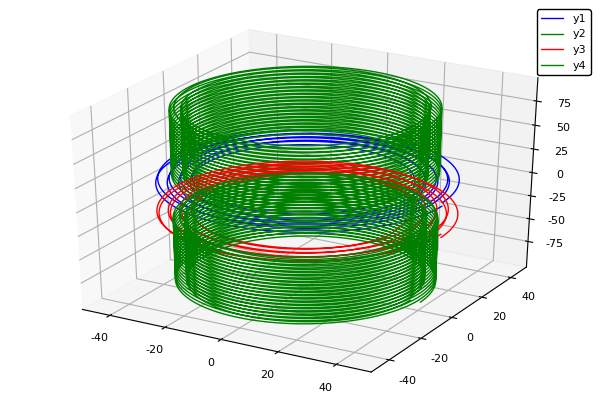

In [31]:
#realistic coil stack
path = Array{Float64,2}(undef, 3,0)
dl = Array{Float64,2}(undef, 3,0)
plt2 = path3d()
#plt3 = path3d()
nstacks = 1;
height = Array{Float64,1}();

#double layer
sign=1
innerRadius=29.55+3.5/2
for i=nstacks:-1:1
    zpos=6.5+4+3.5/2+3.5*2*(i-1) # 6.5mm is the distance from atom to the window. 4mm is from window to the bottom of first coil layer
    if i==1
        p = permutedims(coilStack(0.0+2*pi/nstacks * (i-1),4,innerRadius,sign,3.5,0.002,zpos)) ##### 29.55+3.5/2 measured from solidworks
    else
        p = permutedims(coilStack(0.0+2*pi/nstacks * (i-1),2,innerRadius,sign,3.5,0.002,zpos)) 
    end
    dp = pathVec(p)
    path = hcat(path,p)
    dl = hcat(dl,dp)
    path3d!(p[1,:],p[2,:],p[3,:],color = "blue")
    #path3d!(dp[1,:],dp[2,:],dp[3,:])
    height=push!(height,zpos+3.5,zpos)
   
end

#normal coils
pitch=20;
zpos=6.5+4+3.5/2+3.5*2

p=permutedims(normalCoil(0.0,pitch,2,71/2,sign,3.5,0.002,zpos));
dp = pathVec(p)
path = hcat(path,p)
dl = hcat(dl,dp)
path3d!(p[1,:],p[2,:],p[3,:],color = "green")

#add bottom gradient coils, flip winding clockness, sign=1-->-1, and the current direction is flipped automatically.
sign=-1
for i=1:nstacks
    zpos=6.5-17.772-4-3.5/2 - 3.5*(2*i-1)
    if i==1
        p = permutedims(coilStack(0.0+2*pi/nstacks * (i-1),4,innerRadius,sign,3.5,0.002, zpos))  
    else
        p = permutedims(coilStack(0.0+2*pi/nstacks * (i-1),2,innerRadius,sign,3.5,0.002, zpos)) 
    end
    
    dp = pathVec(p)
    path = hcat(path,p)
    dl = hcat(dl,dp)
    path3d!(p[1,:],p[2,:],p[3,:],color = "red")
    #path3d!(dp[1,:],dp[2,:],dp[3,:])
    height=push!(height,zpos+3.5,zpos)
end
print(height)

#normal coils
zpos=6.5-17.772-4-3.5/2 - 3.5*2-pitch*3.5
p=permutedims(normalCoil(0.0,pitch,2,71/2,sign,3.5,0.002,zpos));
dp = pathVec(p)
path = hcat(path,p)
dl = hcat(dl,dp)
path3d!(p[1,:],p[2,:],p[3,:],color = "green")

# Switch plotting backends to get interactive view
pyplot()

plt2

In [32]:
zpos=6.5+4+3.5/2+3.5*2
upNormalHeight=Array{Float64,1}();
for i=1:pitch
    upNormalHeight=push!(upNormalHeight,zpos+(i-1).*3.5) ##### The extra +3.5/2 is to take the middle height of one single helix
end
upNormalHeight

zpos=6.5-17.772-4-3.5/2 - 3.5*2-pitch*3.5
bottomNormalHeight=Array{Float64,1}();
for i=1:pitch
    bottomNormalHeight=push!(bottomNormalHeight,zpos+i.*3.5) ##### The extra -3.5/2 is to take the middle height of one single helix
end
bottomNormalHeight

normalHeight=vcat(upNormalHeight,bottomNormalHeight)
normalHeight

40-element Array{Float64,1}:
  19.25            
  22.75            
  26.25            
  29.75            
  33.25            
  36.75            
  40.25            
  43.75            
  47.25            
  50.75            
  54.25            
  57.75            
  61.25            
   ⋮               
 -62.52199999999999
 -59.02199999999999
 -55.52199999999999
 -52.02199999999999
 -48.52199999999999
 -45.02199999999999
 -41.52199999999999
 -38.02199999999999
 -34.52199999999999
 -31.02199999999999
 -27.52199999999999
 -24.02199999999999

In [33]:
bnorm = Array{Float64,1}();
bgrad = Array{Float64,1}();
bcx = Array{Float64,1}();
bcy = Array{Float64,1}();
bcz = Array{Float64,1}();
for i=-4:0.1:4
    push!(bnorm,fieldZComponent([0.0,0.0,i],path,dl))
    push!(bgrad,normGrad([0.0,0.0,i])[3])
    nc = normCurve([0.0,0.0,i])
    push!(bcz,nc[3,3])
    push!(bcy,nc[2,2])
    push!(bcx,nc[1,1])
end

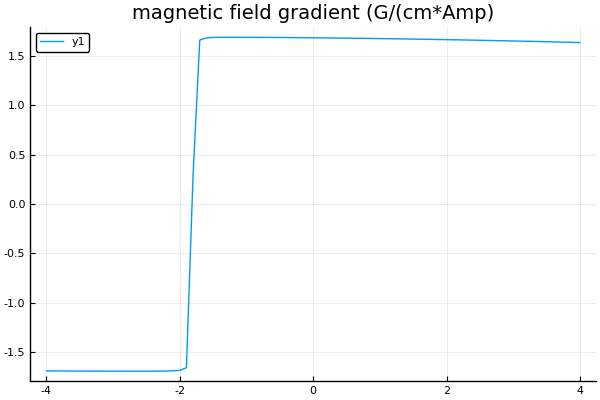

In [34]:
# Switch plotting backends to get static view
pyplot()
plot(-4:0.1:4,bgrad*10,title = "magnetic field gradient (G/(cm*Amp)")

In [35]:
bgrad*10

81-element Array{Float64,1}:
 -1.689031878046086 
 -1.6894410245091487
 -1.689821396079868 
 -1.690172775073996 
 -1.6904948797452684
 -1.6907873408093383
 -1.6910496673731803
 -1.6912811964298125
 -1.6914810161877885
 -1.6916478465107416
 -1.6917798466818923
 -1.6918742952453638
 -1.6919270345199617
  ⋮                 
  1.6535015967190214
  1.6520453845278693
  1.650563002346165 
  1.649054498621079 
  1.647519922516241 
  1.6459593239651786
  1.6443727537200148
  1.6427602633962524
  1.6411219055142159
  1.6394577335386875
  1.6377678019149464
  1.6360521661035619

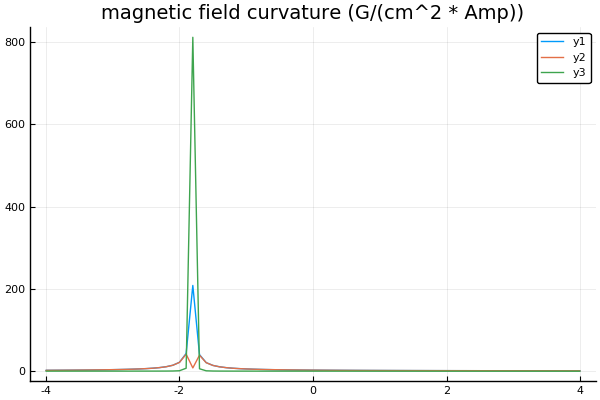

In [36]:
plot(-4:0.1:4,bcx*100,title = "magnetic field curvature (G/(cm^2 * Amp))")
plot!(-4:0.1:4,bcy*100)
plot!(-4:0.1:4,bcz*100)

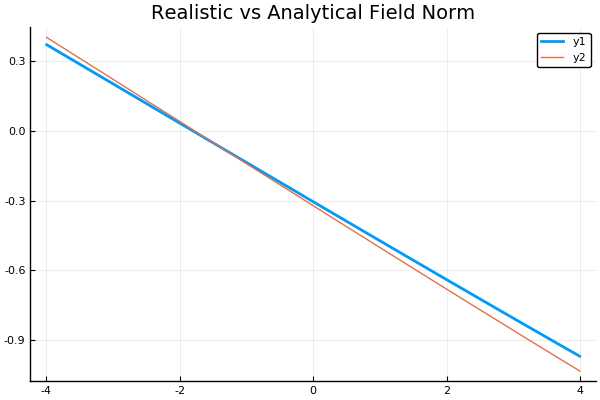

In [37]:
#find the analytical solution of the coil design by treating each layer by a single loop
anaNormZ = Array{Float64,1}();

z = collect(-4:0.1:4)
anaNormZ=zeros(length(z))



###contribution from bilayer############
turns=4;

for j=1:turns
    r=29.55+3.5+(j-1).*3.5

    for i=1:Int(length(height)/2)
        anaNormZ = anaNormZ.+2*pi*1*(r.^2).*(r.^2 .+ (z.-height[i]).^2).^(-1.5)
    end

    for i=Int(length(height)/2)+1:Int(length(height))
        anaNormZ = anaNormZ.-2*pi*1*(r.^2).*(r.^2 .+ (z.-height[i]).^2).^(-1.5)
    end
end

###contribution from normal winding coils############

layers=2;

for j=1:layers
    r=71/2+3.5/2+(j-1).*3.5
    for i=1:Int(length(normalHeight)/2)
        anaNormZ = anaNormZ.+2*pi*1*(r.^2).*(r.^2 .+ (z.-normalHeight[i]).^2).^(-1.5)
    end

    for i=Int(length(normalHeight)/2)+1:Int(length(normalHeight))
        anaNormZ = anaNormZ.-2*pi*1*(r.^2).*(r.^2 .+ (z.-normalHeight[i]).^2).^(-1.5)
    end
    
end

###contribution from transition part in normal winding coils############
r=71/2+3.5
anaNormZ = anaNormZ.+2*pi*1*(r.^2).*(r.^2 .+ (z.-normalHeight[pitch].-3.5).^2).^(-1.5)
anaNormZ = anaNormZ.-2*pi*1*(r.^2).*(r.^2 .+ (z.-normalHeight[pitch*2].-3.5).^2).^(-1.5)


plot(z,bnorm,linewidth=2,title="Realistic vs Analytical Field Norm")
plot!(z,-anaNormZ)




In [38]:
bnorm

81-element Array{Float64,1}:
  0.3715493314365272 
  0.35465623896125037
  0.3377591259214676 
  0.3208582695919815 
  0.3039539471647354 
  0.28704643574447514
  0.2701360123438962 
  0.25322295387964566
  0.23630753716752845
  0.2193900389191443 
  0.2024707357370045 
  0.18554990411078418
  0.16862782041326768
  ⋮                  
 -0.7890959312989325 
 -0.8056238153502535 
 -0.8221370003963552 
 -0.8386352253426272 
 -0.8551182295534927 
 -0.8715857528639941 
 -0.888037535588614  
 -0.9044733185330353 
 -0.920892843004467  
 -0.9372958508222192 
 -0.9536820843295599 
 -0.9700512864046194 

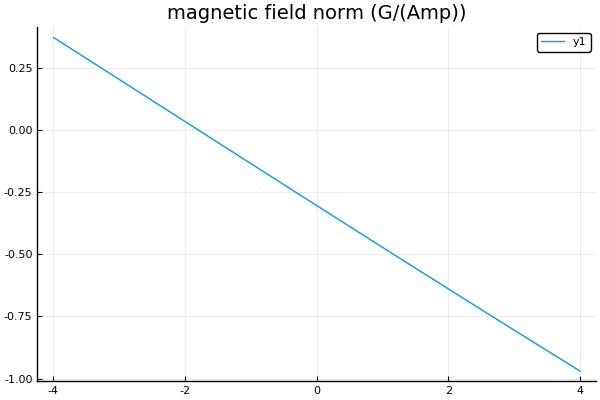

In [39]:
plot(-4:0.1:4,bnorm,title = "magnetic field norm (G/(Amp))")

In [28]:
@btime normCurve([0.0,0.0,0.0])

  1.586 s (58 allocations: 1.02 GiB)


3×3 Array{Float64,2}:
  0.024258    -6.48997e-5    4.57686e-5 
 -6.48997e-5   0.0242453     0.000542995
  4.57686e-5   0.000542995  -0.000650476

In [29]:
@btime normGrad([0.0,0.0,0.0])

  439.420 ms (53 allocations: 260.20 MiB)


3-element Array{Float64,1}:
 -7.188036950463598e-5 
 -0.0008530639675532374
  0.1723355237730655   

In [30]:
@btime fieldNorm([0.0,0.0,0.0],path,dl)

  60.228 ms (50 allocations: 65.05 MiB)


0.31041521514367804